# Primera entrega del proyecto final

### Objetivos Generales:

1. Entender el problema de negocio e identificar los elementos a ser considerados para el planteamiento de un Modelo de Data Science.

2. Describir los datos de negocio y las relaciones entre datos mediante el Análisis Exploratorio de Datos.

3. Construir una presentación ejecutiva para la alta gerencia mostrando los resultados obtenidos.


### Objetivos Específicos:

1. Desarrollar las instancias de Data Acquisition y Data Wrangling en tu trabajo final.

2. Lograr una articulación en equipo y una división de tareas adecuadas a los objetivos.

3. Realizar Filtrado

4. Describir qué significa cada variable, cómo se comporta.

5. Especificar las distribuciones y relaciones (géneros, sexo, edad, IVA, tipo de empresa).

### Se debe entregar:

1. Presentación de la empresa, organización o problema específico.

2. Preguntas y objetivos de la investigación.

3. Conformación del equipo de trabajo.

4. Indicación de la fuente del dataset y los criterios de selección (Data Acquisition).

5. Generación del primer Data Wrangling y EDA, apuntado a sus datos (insights) univariado, bivariado y multivariado.

6. Análisis de componentes principales.

7. Contar la historia de sus datos

8. Filtros aplicados a los datos. Distribución. Dataset final para analizar.

9. Palttear objetivos u objetivo para esos datos.


In [12]:
# Importamos librerias para trabajar
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import FormatStrFormatter
from seaborn import boxplot, violinplot
from pandas_profiling import ProfileReport

In [4]:
# Leemos el dataset a utilizar
df = pd.read_csv('../datasetsGrandes/spotifySongs/tracks.csv')
df.head()

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,35iwgR4jXetI318WEWsa1Q,Carve,6,126903,0,['Uli'],['45tIt06XoI0Iio4LBEVpls'],1922-02-22,0.645,0.4450,0,-13.338,1,0.4510,0.674,0.7440,0.151,0.127,104.851,3
1,021ht4sdgPcrDgSk7JTbKY,Capítulo 2.16 - Banquero Anarquista,0,98200,0,['Fernando Pessoa'],['14jtPCOoNZwquk5wd9DxrY'],1922-06-01,0.695,0.2630,0,-22.136,1,0.9570,0.797,0.0000,0.148,0.655,102.009,1
2,07A5yehtSnoedViJAZkNnc,Vivo para Quererte - Remasterizado,0,181640,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.434,0.1770,1,-21.180,1,0.0512,0.994,0.0218,0.212,0.457,130.418,5
3,08FmqUhxtyLTn6pAh6bk45,El Prisionero - Remasterizado,0,176907,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.321,0.0946,7,-27.961,1,0.0504,0.995,0.9180,0.104,0.397,169.980,3
4,08y9GfoqCWfOGsKdwojr5e,Lady of the Evening,0,163080,0,['Dick Haymes'],['3BiJGZsyX9sJchTqcSA7Su'],1922,0.402,0.1580,3,-16.900,0,0.0390,0.989,0.1300,0.311,0.196,103.220,4


In [5]:
# Verificamos nulls
df.isnull().sum()

id                   0
name                71
popularity           0
duration_ms          0
explicit             0
artists              0
id_artists           0
release_date         0
danceability         0
energy               0
key                  0
loudness             0
mode                 0
speechiness          0
acousticness         0
instrumentalness     0
liveness             0
valence              0
tempo                0
time_signature       0
dtype: int64

In [6]:
df.shape

(586672, 20)

In [8]:
df.count()

id                  586672
name                586601
popularity          586672
duration_ms         586672
explicit            586672
artists             586672
id_artists          586672
release_date        586672
danceability        586672
energy              586672
key                 586672
loudness            586672
mode                586672
speechiness         586672
acousticness        586672
instrumentalness    586672
liveness            586672
valence             586672
tempo               586672
time_signature      586672
dtype: int64

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 586672 entries, 0 to 586671
Data columns (total 20 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   id                586672 non-null  object 
 1   name              586601 non-null  object 
 2   popularity        586672 non-null  int64  
 3   duration_ms       586672 non-null  int64  
 4   explicit          586672 non-null  int64  
 5   artists           586672 non-null  object 
 6   id_artists        586672 non-null  object 
 7   release_date      586672 non-null  object 
 8   danceability      586672 non-null  float64
 9   energy            586672 non-null  float64
 10  key               586672 non-null  int64  
 11  loudness          586672 non-null  float64
 12  mode              586672 non-null  int64  
 13  speechiness       586672 non-null  float64
 14  acousticness      586672 non-null  float64
 15  instrumentalness  586672 non-null  float64
 16  liveness          58

In [10]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
popularity,586672.0,27.570053,18.370642,0.0,13.0000,27.000000,41.00000,100.000
duration_ms,586672.0,230051.167286,126526.087418,3344.0,175093.0000,214893.000000,263867.00000,5621218.000
explicit,586672.0,0.044086,0.205286,0.0,0.0000,0.000000,0.00000,1.000
danceability,586672.0,0.563594,0.166103,0.0,0.4530,0.577000,0.68600,0.991
energy,586672.0,0.542036,0.251923,0.0,0.3430,0.549000,0.74800,1.000
key,586672.0,5.221603,3.519423,0.0,2.0000,5.000000,8.00000,11.000
loudness,586672.0,-10.206067,5.089328,-60.0,-12.8910,-9.243000,-6.48200,5.376
mode,586672.0,0.658797,0.474114,0.0,0.0000,1.000000,1.00000,1.000
speechiness,586672.0,0.104864,0.179893,0.0,0.0340,0.044300,0.07630,0.971
acousticness,586672.0,0.449863,0.348837,0.0,0.0969,0.422000,0.78500,0.996


In [13]:
#Data Profiling
profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

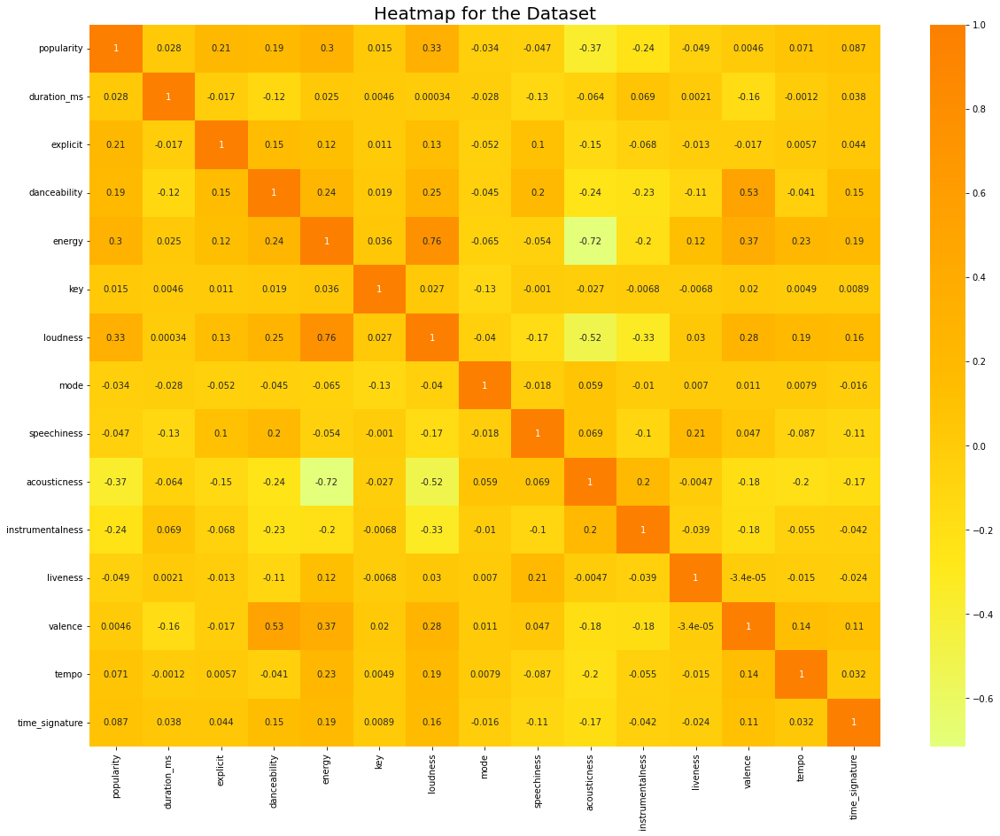

In [23]:
#Hagamos un HeatMap del df
with plt.rc_context({'figure.facecolor':'white'}):
    plt.rcParams['figure.figsize'] = (20, 15)
    sns.heatmap(df.corr(), annot = True, cmap = 'Wistia')
    plt.title('Heatmap for the Dataset', fontsize = 20)
    plt.show()

Vamos a enfocarnos en realizar los analisis sobre popularity

In [17]:
df.popularity.describe()

count    586672.000000
mean         27.570053
std          18.370642
min           0.000000
25%          13.000000
50%          27.000000
75%          41.000000
max         100.000000
Name: popularity, dtype: float64

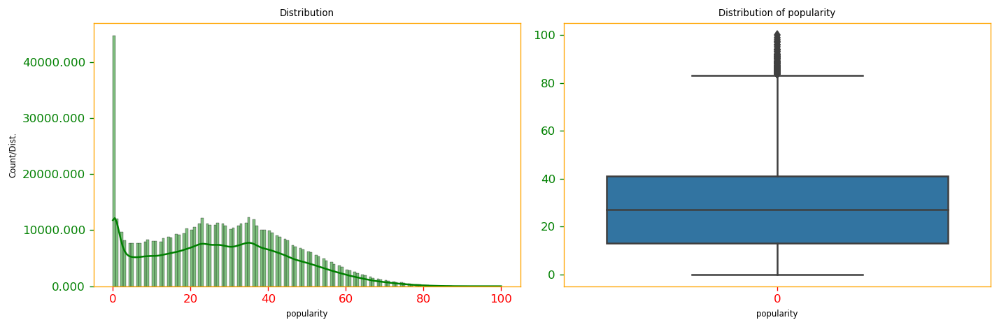

In [20]:
def graph(df, column):
    with plt.rc_context({'axes.edgecolor':'orange', 'xtick.color':'red', 'ytick.color':'green', 'figure.facecolor':'white'}):
        fig,axes = plt.subplots(nrows=1,ncols=2,dpi=120,figsize = (12,4))

        plot0=sns.histplot(data= df, x=column, kde=True,ax=axes[0],color='green')
        axes[0].yaxis.set_major_formatter(FormatStrFormatter('%.3f'))
        axes[0].set_title('Distribution',fontdict={'fontsize':8})
        axes[0].set_xlabel(column,fontdict={'fontsize':7})
        axes[0].set_ylabel('Count/Dist.',fontdict={'fontsize':7})
        plt.tight_layout()

        plot1=sns.boxplot(data=df[column],ax=axes[1], orient="v")
        axes[1].set_title('Distribution of popularity',fontdict={'fontsize':8})
        axes[1].set_xlabel(column,fontdict={'fontsize':7})
        plt.tight_layout()

graph(df, 'popularity')

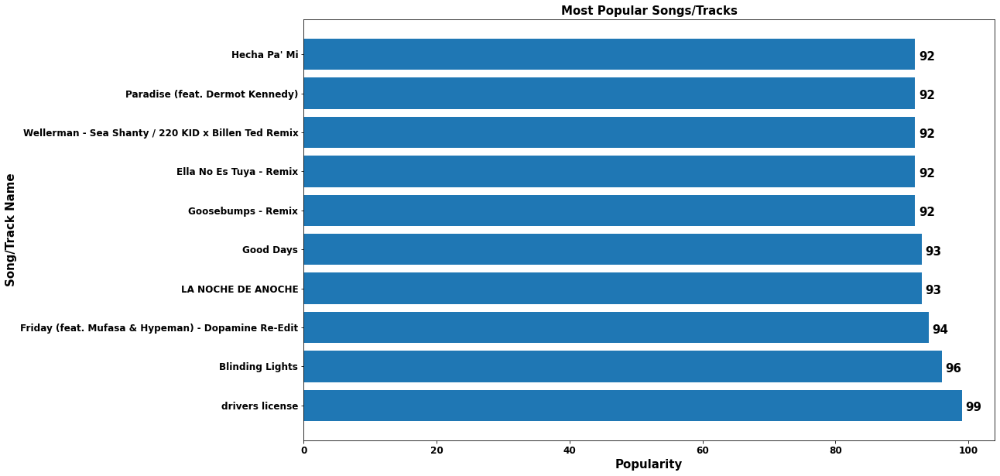

In [21]:
# MOST POPULAR SONGS
# Get top 10 most popular tracks
popular_songs = df.groupby('name')['popularity'].mean().sort_values(ascending=False).head(10)

# Plot horizontal bar chart
with plt.rc_context({'figure.facecolor':'white'}):
    plt.figure(figsize=(16, 10))
    plt.barh(popular_songs.index, popular_songs)
    plt.title('Most Popular Songs/Tracks', fontdict=dict(fontsize=15), fontweight='bold')
    plt.xlabel('Popularity', fontdict=dict(fontsize=15), fontweight='bold')
    plt.ylabel('Song/Track Name', fontdict=dict(fontsize=15), fontweight='bold')
    plt.xticks(fontsize='large', weight='bold')
    plt.yticks(fontsize='large', weight='bold')
    for i, v in enumerate(popular_songs):
        plt.text(v+0.5, i-0.15, str(int(v)), fontdict=dict(fontsize=15), fontweight='bold')
    plt.show()